# **Electric_Vehicle_Population**

This analysis collects data on the annual production of electric cars to identify trends and predict future production volumes. By examining historical patterns, we aim to forecast the growth of electric vehicle manufacturing in the coming years.

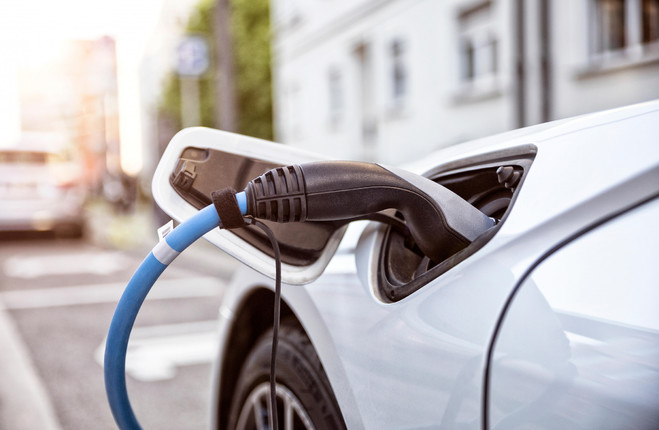

## **Import Necessary Libraries**

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

In [3]:
df = pd.read_csv('/content/Electric_Vehicle_Population_Data.csv')

In [4]:
df.head(5)

,VIN (1-10),County,City,State,ZIP Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location
0,WA1AAAGE2M,Kitsap,POULSBO,WA,98370,2021,AUDI,E-TRON,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,222,0,23.0,148815901,POINT (-122.63339300000001 47.748427)
1,WBY8P2C00L,King,SEATTLE,WA,98122,2020,BMW,I3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,153,0,37.0,132197810,POINT (-122.303413 47.61065)
2,5YJXCBE21K,Cowlitz,SILVERLAKE,WA,98645,2019,TESLA,MODEL X,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,289,0,20.0,154341673,POINT (-122.772699 46.320526)
3,1FTZR081XY,King,SEATTLE,WA,98117,2000,FORD,RANGER,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,58,0,36.0,169378338,POINT (-122.379354 47.687571)
4,WBY1Z6C55H,King,SEATTLE,WA,98119,2017,BMW,I3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,81,0,36.0,192605101,POINT (-122.36772100000002 47.639264)


In [5]:
print(f'Number of rows {df.shape[0]} & Number of columns {df.shape[1]}')

Number of rows 79767 & Number of columns 15


In [6]:
df.columns

Index(['VIN (1-10)', 'County', 'City', 'State', 'ZIP Code', 'Model Year',
       'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP', 'Legislative District', 'DOL Vehicle ID',
       'Vehicle Location'],
      dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79767 entries, 0 to 79766
Data columns (total 15 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   VIN (1-10)                                         79767 non-null  object 
 1   County                                             79762 non-null  object 
 2   City                                               79767 non-null  object 
 3   State                                              79767 non-null  object 
 4   ZIP Code                                           79767 non-null  int64  
 5   Model Year                                         79767 non-null  int64  
 6   Make                                               79767 non-null  object 
 7   Model                                              79767 non-null  object 
 8   Electric Vehicle Type                              79767 non-null  object 
 9   Clean 

In [8]:
df.dtypes.value_counts()

,count
object,9
int64,5
float64,1


In [9]:
df.describe() #numerical columns

,ZIP Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID
count,79767.000000,79767.000000,79767.000000,79767.000000,79621.000000,7.976700e+04
mean,98175.310717,2017.628593,124.564657,2944.268244,30.155951,2.000605e+08
std,2421.827066,2.575634,102.889970,13198.091967,14.581692,1.186443e+08
min,1731.000000,1993.000000,0.000000,0.000000,1.000000,4.385000e+03
25%,98052.000000,2016.000000,25.000000,0.000000,20.000000,1.284644e+08
50%,98121.000000,2018.000000,84.000000,0.000000,34.000000,1.611321e+08
75%,98370.000000,2020.000000,215.000000,0.000000,43.000000,2.556447e+08
max,99403.000000,2022.000000,337.000000,845000.000000,49.000000,4.792548e+08


checking for null values

In [10]:
df.isna().sum()

,0
VIN (1-10),0
County,5
City,0
State,0
ZIP Code,0
Model Year,0
Make,0
Model,0
Electric Vehicle Type,0
Clean Alternative Fuel Vehicle (CAFV) Eligibility,0


In [11]:
df['Legislative District'].unique()

array([23., 37., 20., 36., 45., 47., 11., 48.,  2., 18., 32., 41., 42.,
       46., 33., 34.,  6., 24., 35., 31., 28., 38.,  1.,  7.,  5., 19.,
       12., 40., 27., 25., 21.,  3., 49., 22., 17., 44., 10., 39., 13.,
       43.,  8., 14., 26.,  4., 16., 30., 29., 15.,  9., nan])

In [12]:
df.County.unique()

array(['Kitsap', 'King', 'Cowlitz', 'Thurston', 'Clark', 'Whatcom',
       'Spokane', 'Clallam', 'Pierce', 'Snohomish', 'Grays Harbor',
       'Chelan', 'San Juan', 'Mason', 'Island', 'Skagit', 'Lincoln',
       'Benton', 'Yakima', 'Grant', 'Lewis', 'Jefferson', 'Kittitas',
       'Okanogan', 'Wahkiakum', 'Franklin', 'Adams', 'Walla Walla',
       'Douglas', 'Skamania', 'Klickitat', 'Bell', 'Whitman', 'Arlington',
       'Frederick', 'Stevens', 'Asotin', 'Nassau', 'Pacific', 'San Diego',
       'Pend Oreille', 'Montgomery', 'Sonoma', 'Liberty', 'Garfield',
       'Rockingham', 'Otero', 'District Of Columbia', 'Santa Barbara',
       'Los Angeles', 'Camden', 'Multnomah', 'Bradley', 'Muscogee',
       'Columbia', 'Placer', 'Anne Arundel', 'Alexandria City',
       'Monterey', 'Chaves', 'Ferry', nan, 'Chesapeake City', 'Fairfax',
       'Norfolk City', 'New Castle', 'Wilson', 'Charles', 'Honolulu',
       'Saint Clair', 'Alameda', 'Bexar', 'Lake', 'Fresno', 'Riverside',
       'Suffolk Ci

In [13]:
df['County'].mode().iloc[0]

'King'

In [14]:
#repalcing na value with County mode value
df['County'].fillna(df['County'].mode().iloc[0],inplace=True)

In [15]:
#repalcing na value with Legislative District mean value
df['Legislative District'].fillna(df['Legislative District'].mean(),inplace=True)

In [16]:
#repalcing na value with Vehicle Location mode value
df['Vehicle Location'].fillna(df['Vehicle Location'].mode().iloc[0],inplace=True)

In [17]:
#check if there any nullvalues
df.isna().sum()

,0
VIN (1-10),0
County,0
City,0
State,0
ZIP Code,0
Model Year,0
Make,0
Model,0
Electric Vehicle Type,0
Clean Alternative Fuel Vehicle (CAFV) Eligibility,0


Checking for duplicate rows

In [18]:
df.duplicated().sum()

0

## **Exploratory Data Analysis**

In [19]:
#Lets check from which county we have more entries from (Top 10)

Counties = df.groupby('County').count().sort_values(by='City',ascending=False)['City'].index
values = df.groupby('County').count().sort_values(by='City',ascending=False)['City'].values

px.bar(x=list(Counties)[:10],y=values[:10],labels={'x':"County Name",'y':"Number of Cars"},color=values[:10])

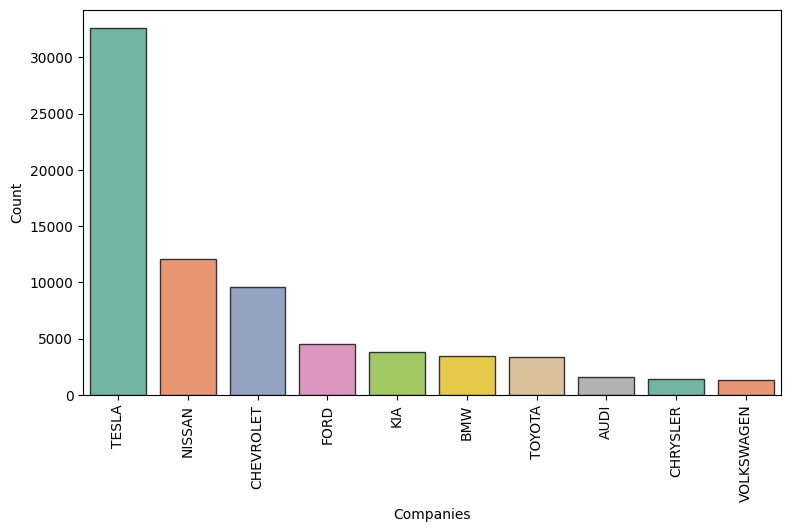

In [20]:
#lets see which company makes most of the electric vehicles
Companies = df.groupby('Make').count().sort_values(by='City',ascending=False)['City'].index
values = df.groupby('Make').count().sort_values(by='City',ascending=False)['City'].values


plt.figure(figsize=(9,5))
sns.barplot(x=list(Companies)[:10],y=values[:10],edgecolor='.2',palette='Set2')
plt.xticks(rotation=90)
plt.xlabel('Companies')
plt.ylabel('Count')
plt.show()

In [21]:
px.pie(names=list(Companies)[:10],values=values[:10],width=500,height=400)

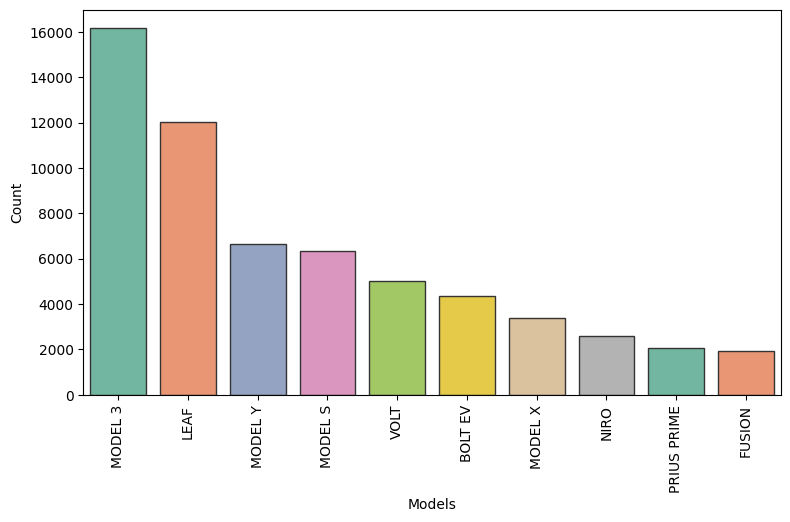

In [22]:
#Top 10 models in use

Models = df.groupby('Model').count().sort_values(by='City',ascending=False)['City'].index
values = df.groupby('Model').count().sort_values(by='City',ascending=False)['City'].values


plt.figure(figsize=(9,5))
sns.barplot(x=list(Models)[:10],y=values[:10],edgecolor='.2',palette='Set2')
plt.xticks(rotation=90)
plt.xlabel('Models')
plt.ylabel('Count')
plt.show()

In [23]:
#what are the most sold models per each company
#lets consider the top 10 companies
top_10_companies = list(Companies)[:10]
for i in top_10_companies:
    data = df[df['Make']==i]
    data = data.groupby('Model').count().sort_values(by='City',ascending=False).index
    print('Top selling model for',i,'is ----------->',data[0])

Top selling model for TESLA is -----------> MODEL 3
Top selling model for NISSAN is -----------> LEAF
Top selling model for CHEVROLET is -----------> VOLT
Top selling model for FORD is -----------> FUSION
Top selling model for KIA is -----------> NIRO
Top selling model for BMW is -----------> I3
Top selling model for TOYOTA is -----------> PRIUS PRIME
Top selling model for AUDI is -----------> E-TRON
Top selling model for CHRYSLER is -----------> PACIFICA
Top selling model for VOLKSWAGEN is -----------> E-GOLF


In [24]:
#Percentage of BEV vs PHEV

Vehicle_type = list(df.groupby('Electric Vehicle Type').count()['County'].index)
values = df.groupby('Electric Vehicle Type').count()['County'].values

px.pie(names=Vehicle_type,values=values,height=400)

In [25]:
#lets see whats the percentage of top 10 companies vehicles are BEV and PHEV

for index,i in enumerate(top_10_companies):
    data = df[df['Make']==i]
    labels = list(data.groupby('Electric Vehicle Type').count()['City'].index)
    values = list(data.groupby('Electric Vehicle Type').count()['City'].values)
    fig = px.pie(names=labels,values=values,width=700,height=400,title=str(i))
    fig.show()

<Axes: xlabel='Electric Range', ylabel='Count'>

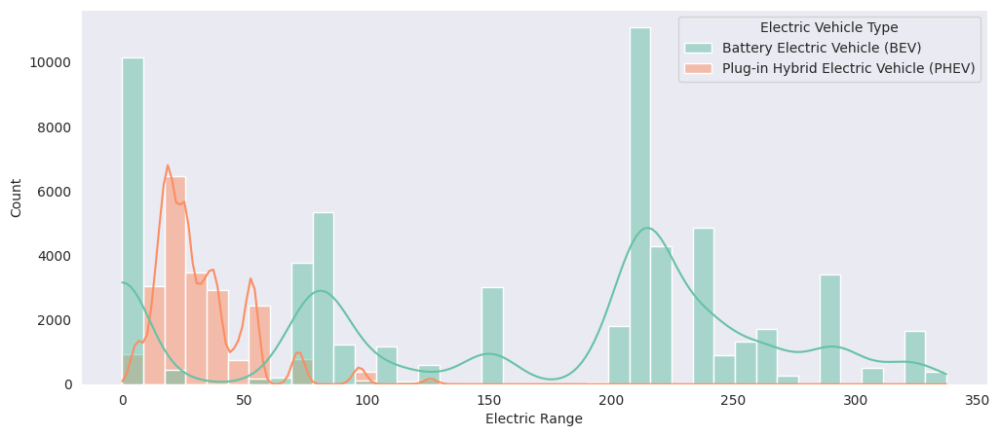

In [26]:
#lets see the electric range difference between PHEV and BEV
plt.figure(figsize=(12,5))
sns.set_style(style='dark')
sns.histplot(x = 'Electric Range',data=df,kde=True,hue='Electric Vehicle Type',palette='Set2')

the data shows that BEVs will give more range but there are some vehicles which give almost 0 range on PHEV


<Axes: xlabel='Electric Range', ylabel='Density'>

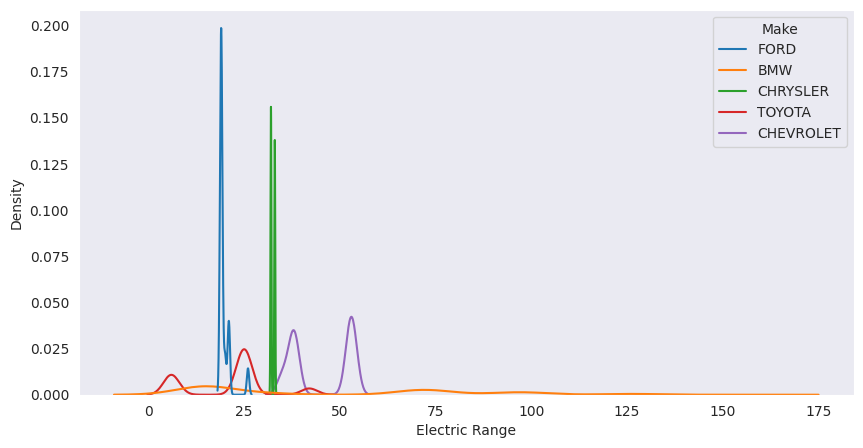

In [27]:
#lets filter out top 5 companies as per each electric vehicle type

#PHEV

data_phev = df[df['Electric Vehicle Type']=='Plug-in Hybrid Electric Vehicle (PHEV)']
companies=list(data_phev.groupby('Make').count().sort_values(by='City',ascending=False)['City'].index)[:5]
data_phev['phe'] = data_phev['Make'].apply(lambda x:1 if x in companies else 0 )
data_phev = data_phev[data_phev['phe']==1]

plt.figure(figsize=(10,5))
sns.kdeplot(x='Electric Range',hue='Make',data=data_phev)

<Axes: xlabel='Electric Range', ylabel='Density'>

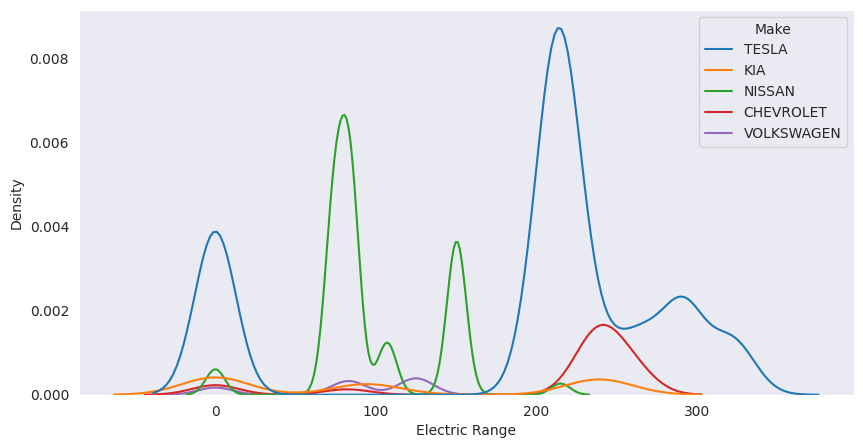

In [28]:
#BEV


data_bev = df[df['Electric Vehicle Type']!='Plug-in Hybrid Electric Vehicle (PHEV)']
companies=list(data_bev.groupby('Make').count().sort_values(by='City',ascending=False)['City'].index)[:5]
data_bev['bev'] = data_bev['Make'].apply(lambda x:1 if x in companies else 0 )
data_bev = data_bev[data_bev['bev']==1]

plt.figure(figsize=(10,5))
sns.kdeplot(x='Electric Range',hue='Make',data=data_bev)

if we remove zero ranges we can see CHEVERLET AND TESLA offering high ranges

lets see top20 most sold cars and top20 most range giving vehicles and check if there is any correlation

In [29]:
top_10_vehicles = list(df.groupby('Model').count().sort_values(by='City',ascending=False)['City'].index)[:10]

In [30]:
top_10_range =  df.sort_values(by='Electric Range',ascending=False)['Model'].unique()[:10]

In [31]:
top_10_vehicles

['MODEL 3',
 'LEAF',
 'MODEL Y',
 'MODEL S',
 'VOLT',
 'BOLT EV',
 'MODEL X',
 'NIRO',
 'PRIUS PRIME',
 'FUSION']

In [32]:
top_10_range

array(['MODEL S', 'MODEL 3', 'MODEL X', 'MODEL Y', 'BOLT EV', 'KONA',
       'ROADSTER', 'NIRO ELECTRIC', 'NIRO', 'I-PACE'], dtype=object)

6 out of top 10 most selling ones are in the top_10 electric range vehicles so range can be a reason of their sales

<Axes: xlabel='Model Year', ylabel='count'>

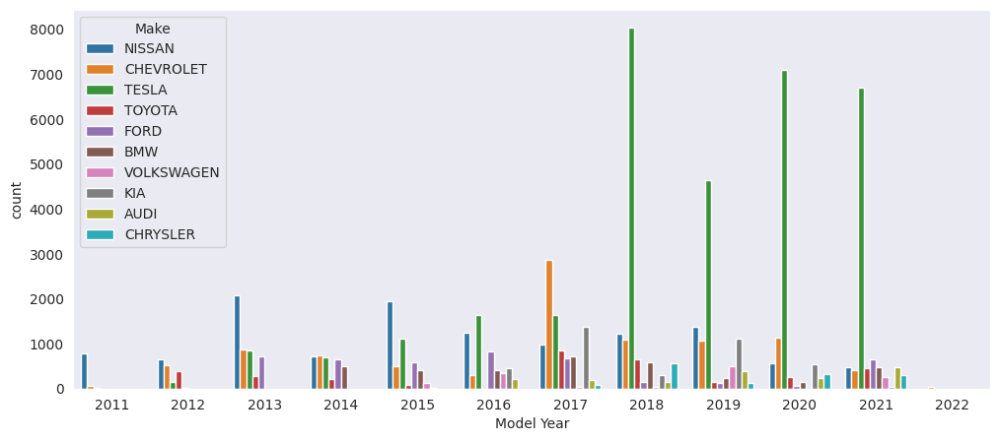

In [33]:
#Number of models of company for each year for last 10 years
#lets consider top_10 companies only

data = df.copy()
data['top_10'] = data['Make'].apply(lambda x:1 if x in top_10_companies else 0)
data = data[data['top_10']==1]
data = data[data['Model Year']>=2011]
plt.figure(figsize=(12,5))
sns.countplot(x = 'Model Year',hue='Make',data=data)

earlier NISSAN and CHEVY used to have hold of the market then TESLA took over it

In [34]:
#if we study an individual company TESLA
#1.which state is having more number of TESLA vehicles
#2.Model of which year is in use the most from TESLA

data_TESLA = df[df['Make']=='TESLA']
top_10_states_TESLA = list(data_TESLA.groupby('State').count().sort_values(by='City',ascending=False)['City'].index)[:10]
values = list(data_TESLA.groupby('State').count().sort_values(by='City',ascending=False)['City'].values)[:10]

<Axes: >

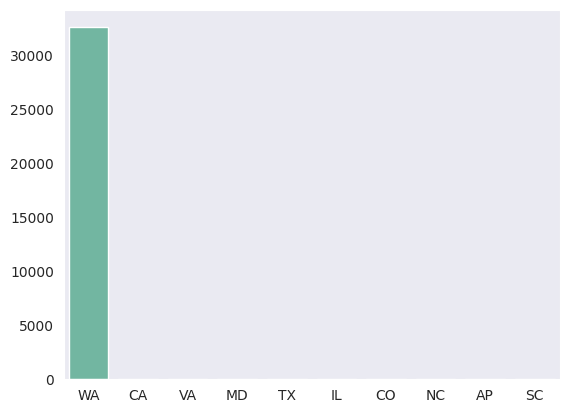

In [35]:
sns.barplot(x = top_10_states_TESLA,y=values,palette='Set2')

In [36]:
values

[32538, 19, 8, 5, 3, 2, 1, 1, 1, 1]

Most of the Tesla vehicles are from 'WA' state

<Axes: >

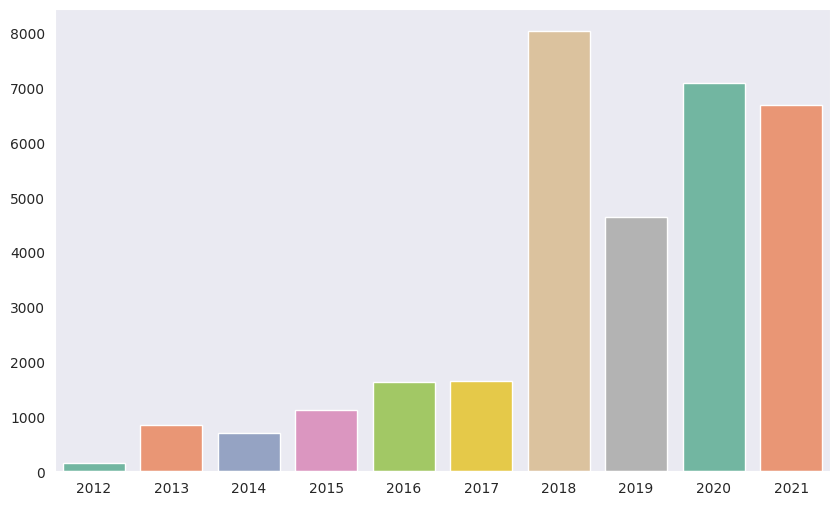

In [37]:
plt.figure(figsize=(10,6))
top_10_year_TESLA = list(data_TESLA.groupby('Model Year').count().sort_values(by='City',ascending=False)['City'].index)[:10]
values = list(data_TESLA.groupby('Model Year').count().sort_values(by='City',ascending=False)['City'].values)[:10]
sns.barplot(x = top_10_year_TESLA,y=values,palette='Set2')

most models are from 2022 which are sold by tesla

(20.0, 60.0)

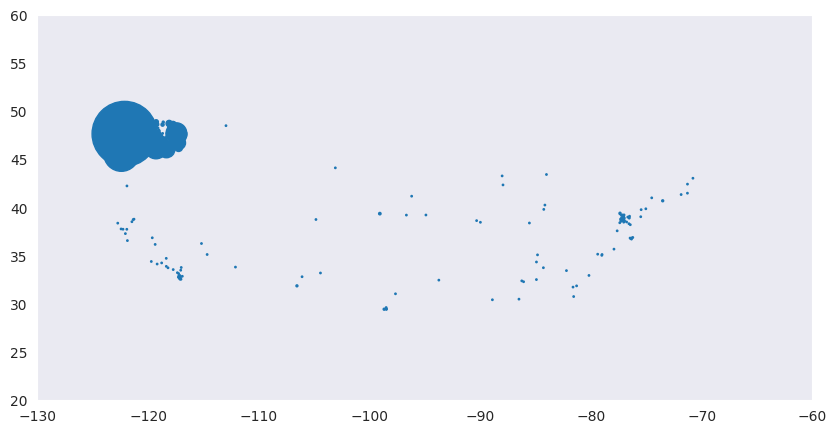

In [38]:
locations = list(df.groupby('Vehicle Location').count()['County'].index)
values = list(df.groupby('Vehicle Location').count()['County'].values)
Location_data = pd.DataFrame({'Locations':locations,'Count':values})
Location_data['Lattitude'] = Location_data['Locations'].apply(lambda x:float(x.split(' ')[1][1:]))
Location_data['Longitude'] = Location_data['Locations'].apply(lambda x:float(x.split(' ')[2][:-1]))

plt.figure(figsize=(10,5))
plt.scatter(x = Location_data['Lattitude'],y = Location_data['Longitude'],s=Location_data['Count'])
plt.xlim(-130,-60)
plt.ylim(20,60)

Most data points are from 'WA' state

In [39]:
df['Lattitude'] = df['Vehicle Location'].apply(lambda x:float(x.split(' ')[1][1:]))
df['Longitude'] = df['Vehicle Location'].apply(lambda x:float(x.split(' ')[2][:-1]))

(20.0, 50.0)

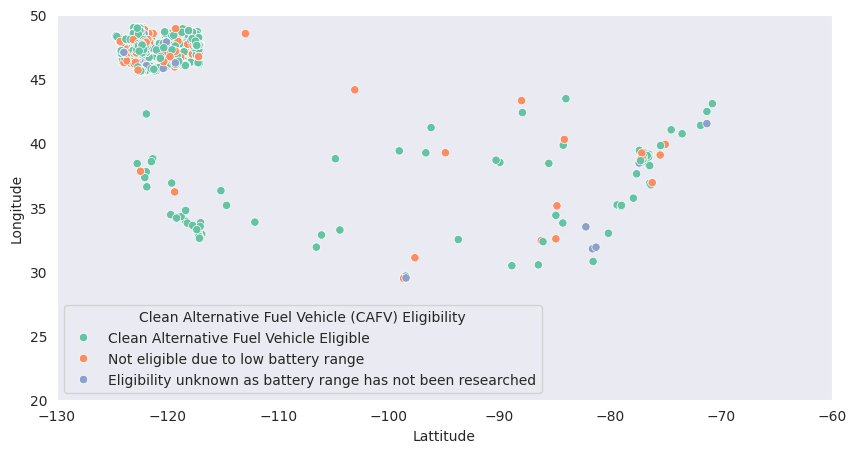

In [40]:
plt.figure(figsize=(10,5))
sns.scatterplot(x = 'Lattitude',y = 'Longitude',data=df,hue='Clean Alternative Fuel Vehicle (CAFV) Eligibility',palette='Set2')
plt.xlim(-130,-60)
plt.ylim(20,50)

density is more at certain regions of the map and distribution of CAFV can be seen

(20.0, 50.0)

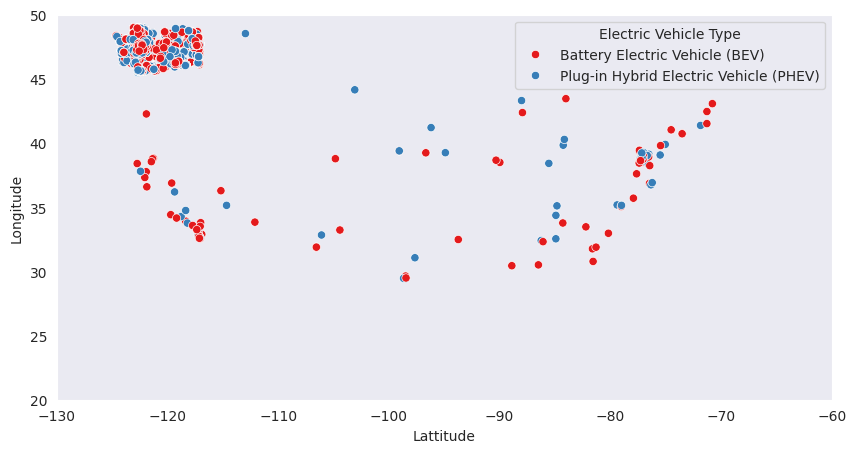

In [41]:
plt.figure(figsize=(10,5))
sns.scatterplot(x = 'Lattitude',y = 'Longitude',data=df,hue='Electric Vehicle Type',palette='Set1')
plt.xlim(-130,-60)
plt.ylim(20,50)

In [42]:
states = list(df.groupby('State').count().sort_values(by='City',ascending=False)['City'].index)
values = df.groupby('State').count().sort_values(by='City',ascending=False)['City'].values

In [43]:
data = pd.DataFrame(df.groupby('State').count().sort_values(by='City',ascending=False)['City'])

In [44]:
data = data.reset_index()
data.columns = ['State','Count']

In [45]:
fig = px.choropleth(data,
                    locations='State',
                    locationmode="USA-states",
                    color='Count',
                    color_continuous_scale="greens",
                    scope="usa")

fig.show()

In [46]:
# Analyze unique values for categorical columns
for col in ['Legislative District', 'County', 'City', 'State', 'Postal Code', 'Model Year', 'Make', 'Model', 'Electric Vehicle Type', 'Clean Alternative Fuel Vehicle (CAFV) Eligibility']:
    # Check if column exists in DataFrame before accessing it
    if col in df.columns:
        print(f"Unique values for {col}: {df[col].nunique()}")
        print(f"Most frequent values for {col}: {df[col].value_counts().head()}")
    else:
        print(f"Column '{col}' not found in DataFrame.")

Unique values for Legislative District: 50
Most frequent values for Legislative District: Legislative District
41.0    5290
45.0    5152
48.0    4663
36.0    3892
46.0    3572
Name: count, dtype: int64
Unique values for County: 113
Most frequent values for County: County
King         41745
Snohomish     8463
Pierce        6039
Clark         4564
Thurston      3095
Name: count, dtype: int64
Unique values for City: 533
Most frequent values for City: City
SEATTLE      15179
BELLEVUE      4115
REDMOND       3127
VANCOUVER     2835
KIRKLAND      2537
Name: count, dtype: int64
Unique values for State: 39
Most frequent values for State: State
WA    79621
CA       36
VA       24
MD       19
TX        8
Name: count, dtype: int64
Column 'Postal Code' not found in DataFrame.
Unique values for Model Year: 20
Most frequent values for Model Year: Model Year
2018    13940
2021    11109
2020    11026
2019    10615
2017     9878
Name: count, dtype: int64
Unique values for Make: 32
Most frequent values 

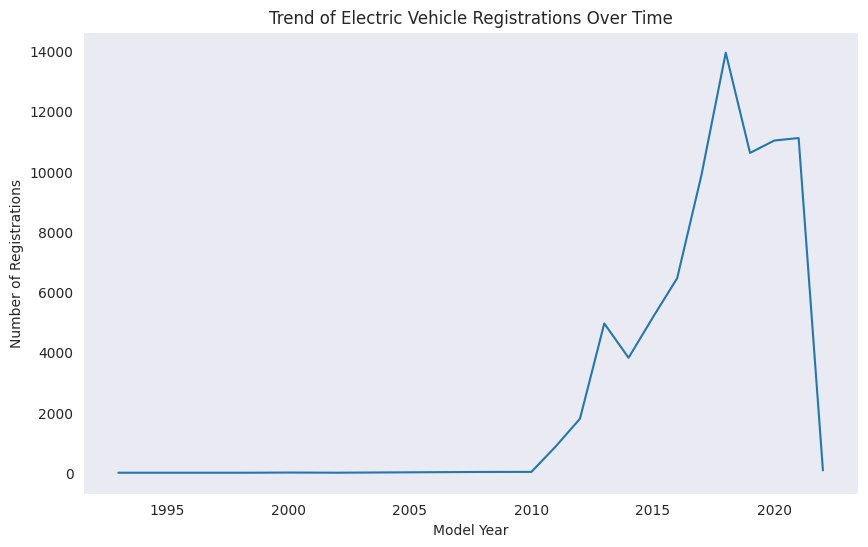

In [47]:
#Temporal Trends in Electric Vehicle Adoption
# Analyze the trend of electric vehicle registrations over time.
# Group the data by model year and count the number of vehicles registered each year.
registrations_by_year = df.groupby('Model Year')['VIN (1-10)'].count().reset_index()

# Create a line plot to visualize the trend.
plt.figure(figsize=(10, 6))
sns.lineplot(x='Model Year', y='VIN (1-10)', data=registrations_by_year)
plt.title('Trend of Electric Vehicle Registrations Over Time')
plt.xlabel('Model Year')
plt.ylabel('Number of Registrations')
plt.show()

In [48]:
# Create a box plot with outliers displayed as individual points
fig = px.box(df, y="Electric Range", title="Electric Vehicle Range with Outliers")
fig.show()

# Calculate the interquartile range (IQR)
Q1 = df['Electric Range'].quantile(0.25)
Q3 = df['Electric Range'].quantile(0.75)
IQR = Q3 - Q1

# Define upper and lower bounds for outlier detection
upper_bound = Q3 + 1.5 * IQR
lower_bound = Q1 - 1.5 * IQR

# Filter the DataFrame to remove outliers
filtered_df = df[(df['Electric Range'] >= lower_bound) & (df['Electric Range'] <= upper_bound)]

# Create a box plot without outliers
fig = px.box(filtered_df, y="Electric Range", title="Electric Vehicle Range without Outliers")
fig.show()

In [49]:
#outliers
numerical_cols = df.select_dtypes(include=['number']).columns

# Create box plots for all numerical columns
for col in numerical_cols:
    # Create box plot with outliers
    fig = px.box(df, y=col, title=f"{col} with Outliers")
    fig.show()

    # Calculate IQR and bounds
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    upper_bound = Q3 + 1.5 * IQR
    lower_bound = Q1 - 1.5 * IQR

    # Filter data to remove outliers
    filtered_df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

    # Create box plot without outliers
    fig = px.box(filtered_df, y=col, title=f"{col} without Outliers")
    fig.show()

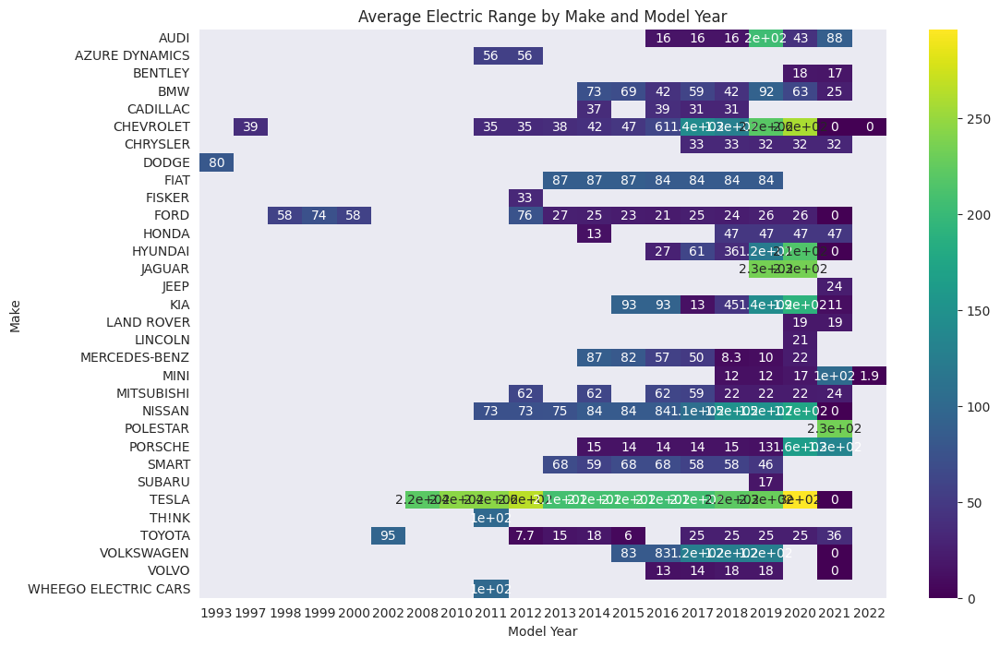

In [50]:
# Average Electric Range by Make and Model Year:**

# Calculate the average electric range for each make and model year.
avg_range_by_make_year = df.groupby(['Make', 'Model Year'])['Electric Range'].mean().reset_index()

# Create a heatmap to visualize the average electric range.
plt.figure(figsize=(12, 8))
# Use keyword arguments for index, columns, and values in pivot
sns.heatmap(avg_range_by_make_year.pivot(index='Make', columns='Model Year', values='Electric Range'), annot=True, cmap='viridis')
plt.title('Average Electric Range by Make and Model Year')
plt.xlabel('Model Year')
plt.ylabel('Make')
plt.show()

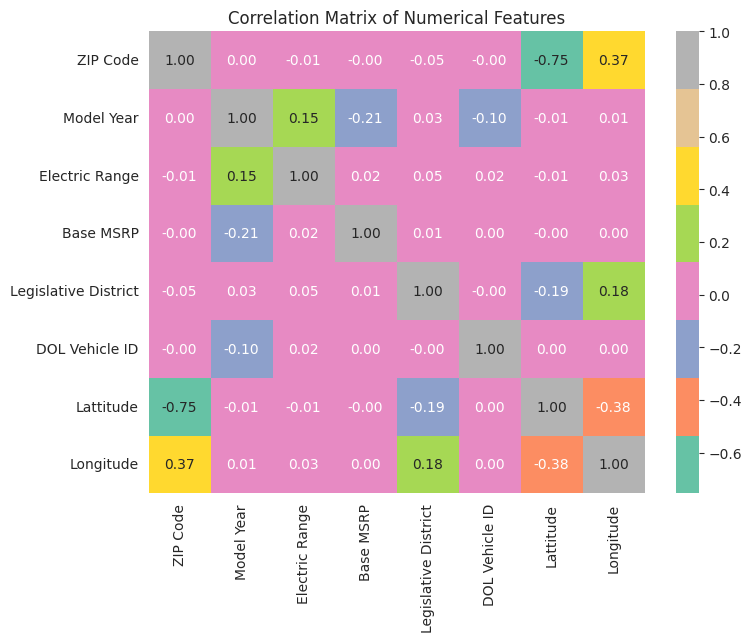

In [51]:
# Calculate the correlation matrix, considering only numeric columns
correlation_matrix = df.corr(numeric_only=True)

# Create a heatmap using seaborn
plt.figure(figsize=(8, 6))  # Adjust figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap= 'Set2' , fmt=".2f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()